In [1]:
import argparse
import os
import sys
import numpy as np

import torch
import matplotlib.pyplot as plt   

sys.path.append('/user_data/mmhender/featsynth/code/')
sys.path.insert(0, '/user_data/mmhender/featsynth/code/')

from utils import things_utils

import PIL

/home/mmhender/imstat_env/lib/python3.7/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [23]:
concepts_filename = '/user_data/mmhender/stimuli/things/concepts_use.npy'
concepts_use = np.load(concepts_filename,allow_pickle=True).item()
categ_names = concepts_use['categ_names']
concept_names_subsample = concepts_use['concept_names_subsample']
image_names = concepts_use['image_names']
concept_ids_subsample = concepts_use['concept_ids_subsample']
n_categ = len(categ_names)
n_conc_each = len(concept_names_subsample[0])


In [5]:
# layers = ['relu1_1', 'pool1','pool2','pool3','pool4']    
layers = ['pool1','pool2','pool3','pool4']    
n_layers = len(layers)

In [7]:
stim_path = '/user_data/mmhender/stimuli/featsynth/images_v1/'

In [17]:
categ_names

['bird',
 'body_part',
 'clothing',
 'dessert',
 'drink',
 'electronic_device',
 'fruit',
 'furniture',
 'home_decor',
 'insect',
 'kitchen_tool',
 'medical_equipment',
 'musical_instrument',
 'office_supply',
 'part_of_car',
 'plant',
 'sports_equipment',
 'toy',
 'vegetable',
 'vehicle',
 'weapon']

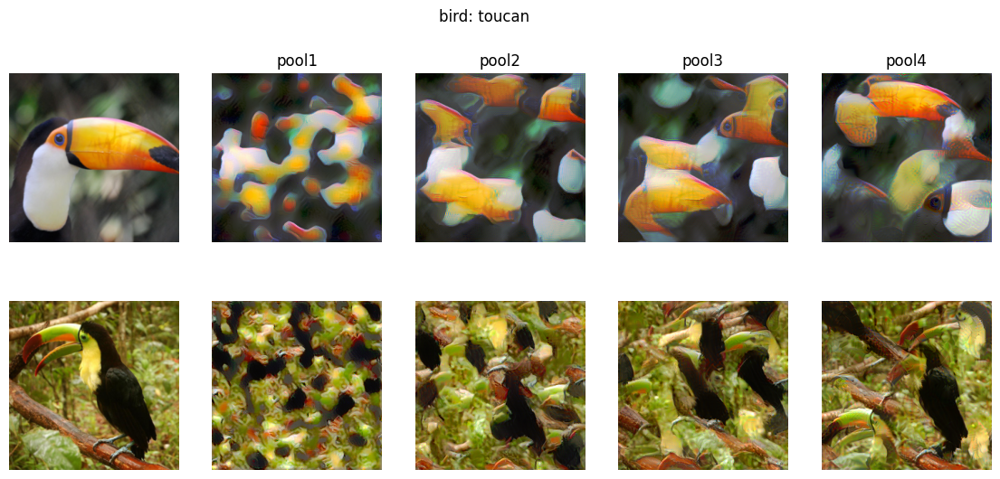

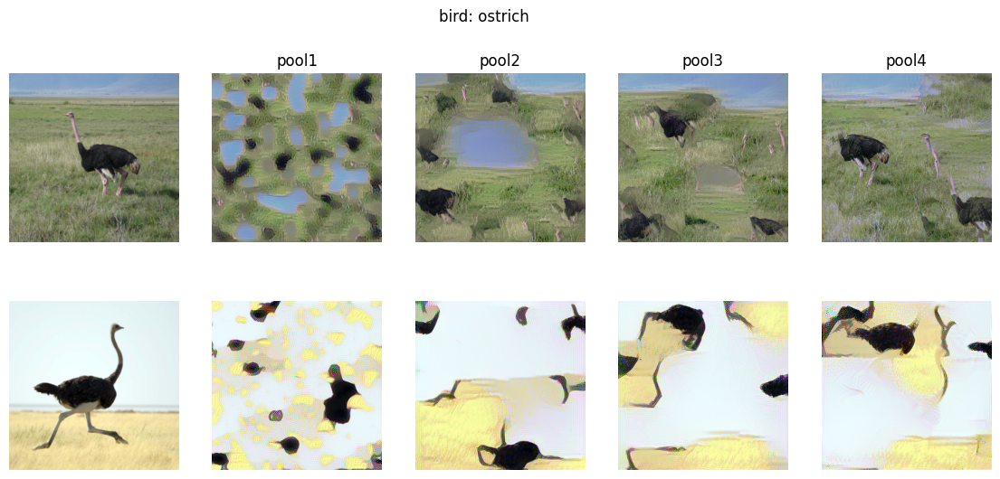

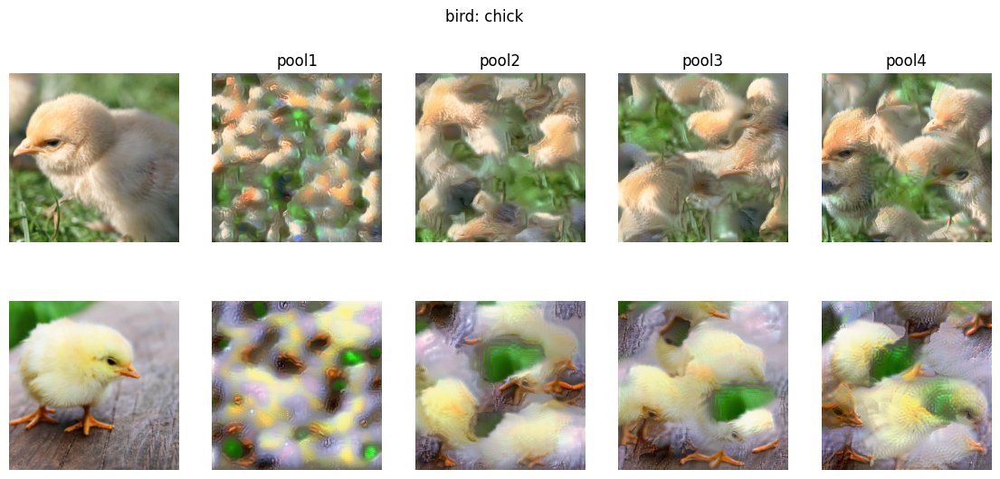

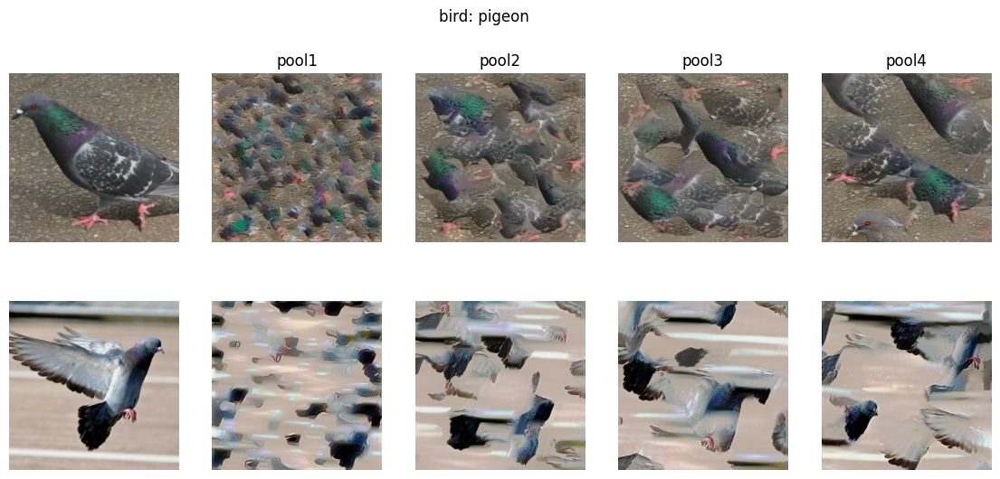

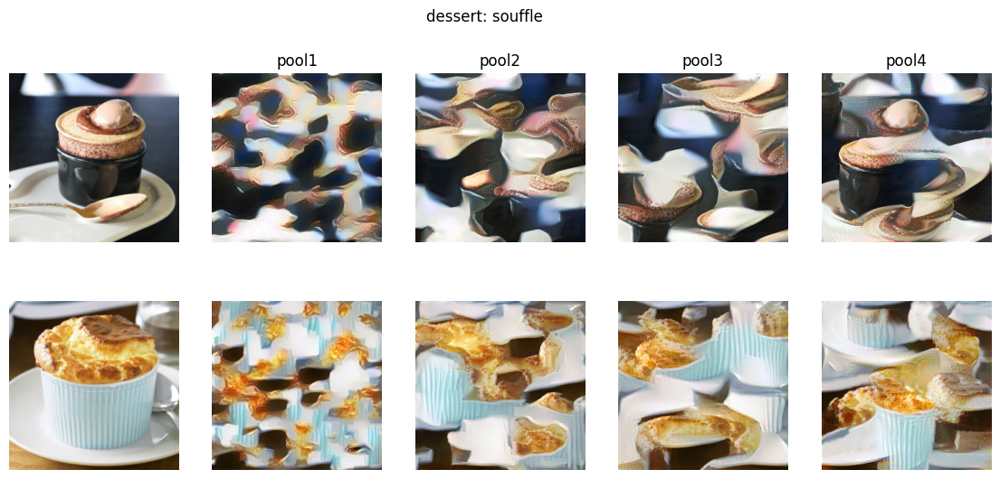

...

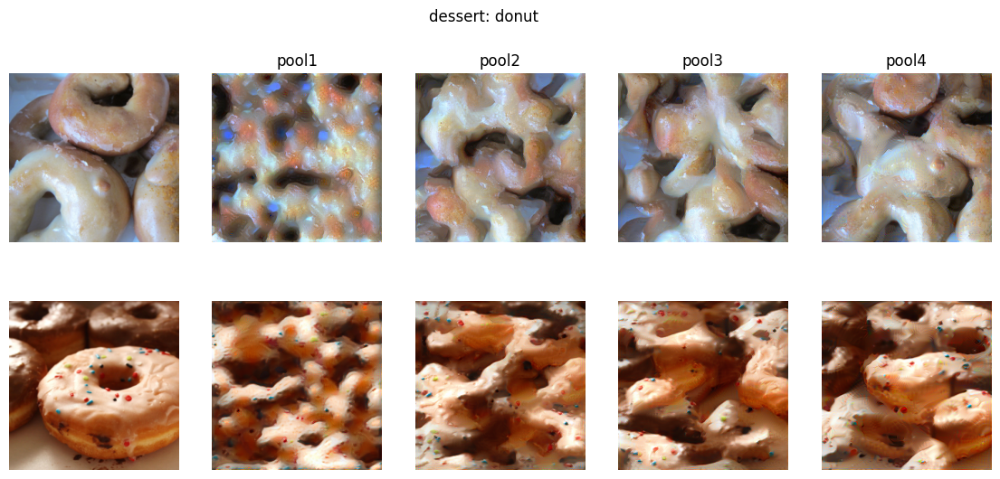

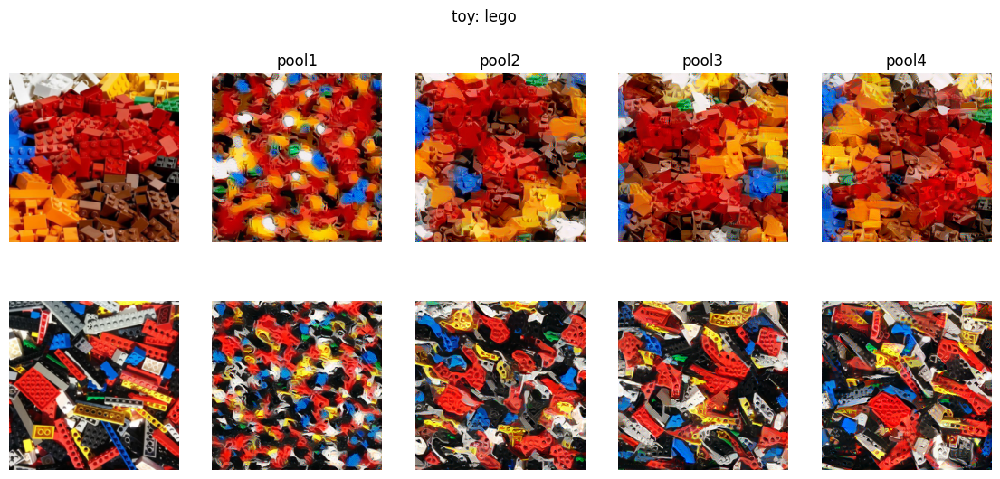

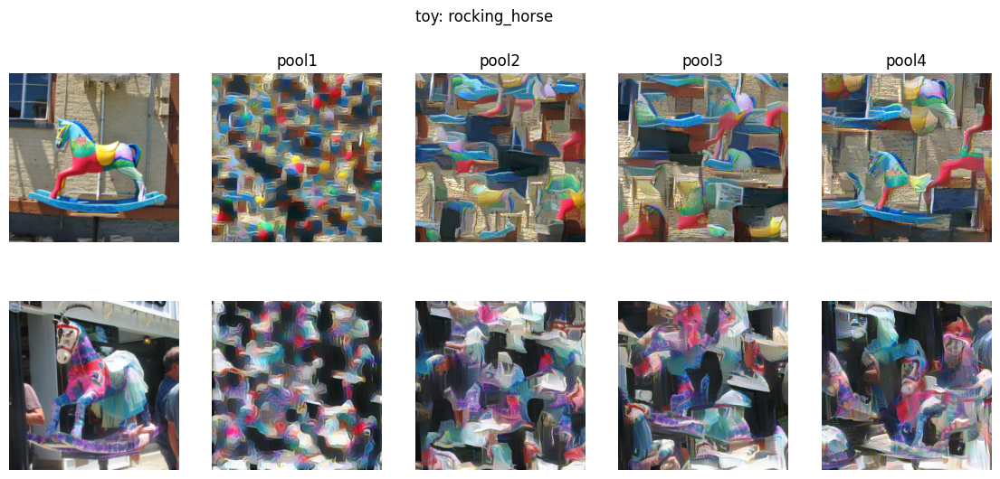

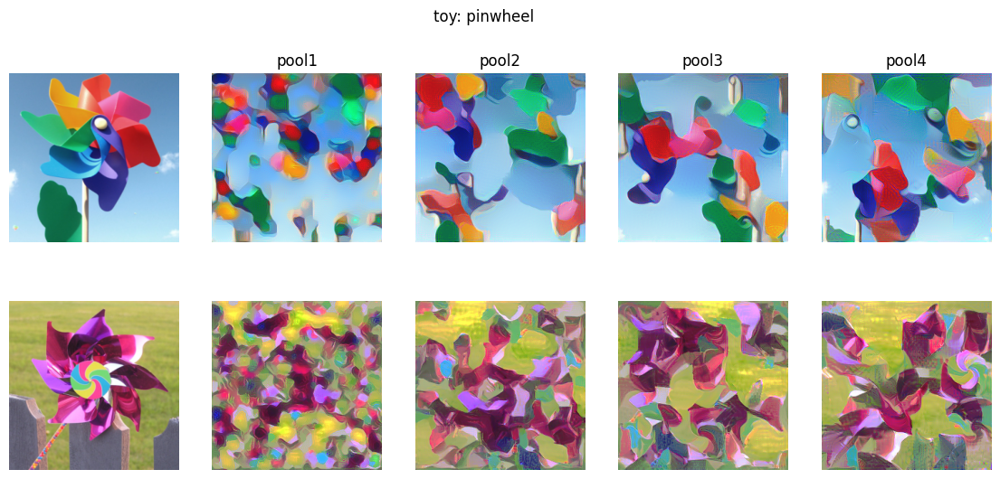

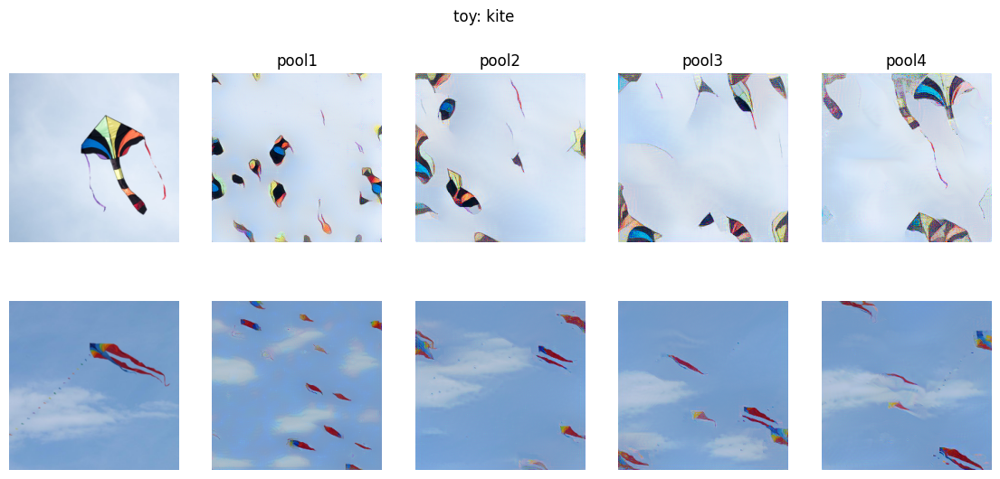

In [18]:
for categ_ind in [0, 3, 17]:

    categ = categ_names[categ_ind]

    conc_plot = np.arange(4)
    ims_plot = np.arange(2)
    n_rows = len(ims_plot)
    # n_rows = len(conc_plot)*len(ims_plot)

    n_grid_eachside = 1
    which_grid=5

    for co, conc_ind in enumerate(conc_plot):
        conc = concept_names_subsample[categ_ind][conc_ind]

        plt.figure(figsize=(14,6))
        pi=0;

        for ii in ims_plot:

            fn = things_utils.get_filename(categ, conc, ii)
            name = fn.split('/')[-1].split('.jpg')[0]

            out_dir = os.path.join(stim_path, name)
            target_image_filename = os.path.join(out_dir, 'orig.png')

            im = PIL.Image.open(target_image_filename)

            pi+=1
            plt.subplot(n_rows, len(layers)+1, pi)
            plt.imshow(im)
            plt.axis('off')
            # if ii==0:
            #     plt.title('orig')

            for ll in range(n_layers):

                scrambled_image_filename = os.path.join(out_dir, \
                                                    'grid5_1x1_upto_%s.png'%(layers[ll]))
                im = PIL.Image.open(scrambled_image_filename)

                pi+=1
                plt.subplot(n_rows, len(layers)+1, pi)
                plt.imshow(im)
                plt.axis('off')
                if ii==0:
                    plt.title(layers[ll])

        plt.suptitle('%s: %s'%(categ, conc))